# Packages and Libraries

In [1]:
!pip install pmdarima
!pip uninstall pandas -y
!pip install pandas==1.1.3
!pip install statsmodels==0.11.0
!pip install bayesian-optimization

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.8 MB 13.2 MB/s 
     |████████████████████████████████| 9.8 MB 49.3 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2
Found existing installation: pandas 1.3.5
Uninstalling pandas-1.3.5:
  Successfully uninstalled pandas-1.3.5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 9.5 MB 14.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 8.7 MB 15.7 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.13.2
    Uninstalling statsmodels-0.13.2:
      Successfully uninstalled statsmodels-0.13.2
ERROR: pip's

In [2]:
import os
import csv
import math
import numpy as np 
import pandas as pd 
import seaborn as sns
import datetime as dt
import pmdarima as pm
import plotly.tools as tls
import plotly.offline as py
import statsmodels.api as sm 
import plotly.graph_objs as go
import matplotlib.pyplot as plt
#----------------
from math import sqrt
from scipy import stats
from keras.models import load_model
from scipy.sparse import hstack, csr_matrix
from matplotlib.colors import ListedColormap
#----------------
from sklearn.metrics import r2_score
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn import svm
#----------------
# Cost Functions
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
#----------------
# Scalers
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
#----------------
# Feature Engineering
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
#----------------
# this will filter out a lot of future warnings from statsmodels
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
#----------------
#modelimport numpy as np
from sklearn.svm import SVR
from subprocess import check_output
#----------------
#---- LSTM Models
from keras.layers import Dense, Dropout, LSTM
from keras.models import Sequential
#---- ARIMA Models
from statsmodels.tsa.arima.model import ARIMA    #new
#from statsmodels.tsa.arima_model import ARIMA   #old
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#----------------
np.set_printoptions(precision=4)
sns.set(font_scale=1.5)
plt.style.use('fivethirtyeight')
%config InlineBackend.figure_format = 'retina'
py.init_notebook_mode(connected=True)
%matplotlib inline
#----------------
# Pallets used for visualizations
color= "Spectral"
color_plt = ListedColormap(sns.color_palette(color).as_hex())
color_hist = 'teal'
BOLD = '\033[1m'
END = '\033[0m'

# Dataset

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Read csv file
df = pd.read_csv('/content/drive/MyDrive/SDA/CapStone/Capstone_Folder_Virson_1/Tadawul_stcks/Tadawul_stcks.csv')

Content

Each row in the database represents the price of a specific stock at a specific date:

symbol (Integer): The symbol or the reference number of the company

name(String) Name of the company

trading_name (String): The trading name of the company

sectoer (String): The sector in which the company operates

date (Date): The date of the stock price

open (Decimal): The opening price

high (Decimal): The highest price of the stock at that day

low (Decimal): The lowest price of the stock at that day

close (Decimal): The closing price

change (Decimal): The change in price from the last day

perc_Change (Decimal): The percentage of the change

volume_traded (Decimal): The volume of the trades for the day

value_traded (Decimal): The value of the trades for the day

no_trades (Decimal): The number of trades for the day

In [5]:
# The purpose of the function is to run the graphs in visualisation section. 

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

# EDA

## Exploratory Data Analysis

In [6]:
# Display the columns:
df.columns

Index(['symbol', 'name', 'trading_name ', 'sectoer', 'date', 'open', 'high',
       'low', 'close', 'change', 'perc_Change', 'volume_traded ',
       'value_traded', 'no_trades '],
      dtype='object')

In [7]:
# Get dataset shape
df.shape

(593819, 14)

In [8]:
# replace white spaces with _ in columns names and lower all character
df.columns = df.columns.str.lower().str.replace(' ', '_')
string_columns = list(df.dtypes[df.dtypes == 'object'].index)

In [9]:
# to view the top 
df.head()

,symbol,name,trading_name_,sectoer,date,open,high,low,close,change,perc_change,volume_traded_,value_traded,no_trades_
0,2030,Saudi Arabia Refineries Co.,SARCO,Energy,2020-03-05,35.55,35.85,34.90,34.90,-0.40,-1.13,436609.0,15399073.50,804.0
1,2030,Saudi Arabia Refineries Co.,SARCO,Energy,2020-03-04,34.70,35.65,34.50,35.30,0.25,0.71,737624.0,25981391.35,1268.0
2,2030,Saudi Arabia Refineries Co.,SARCO,Energy,2020-03-03,34.70,35.15,34.70,35.05,1.05,3.09,489831.0,17116413.40,854.0
3,2030,Saudi Arabia Refineries Co.,SARCO,Energy,2020-03-02,35.20,35.65,34.00,34.00,-0.55,-1.59,736157.0,25858700.60,1242.0
4,2030,Saudi Arabia Refineries Co.,SARCO,Energy,2020-03-01,35.35,35.60,34.25,34.55,-2.05,-5.60,738685.0,25747967.55,1625.0


In [10]:
# to view the bottom 
df.tail()

,symbol,name,trading_name_,sectoer,date,open,high,low,close,change,perc_change,volume_traded_,value_traded,no_trades_
593814,4321,Arabian Centres Co.,ALMRAKEZ,Real Estate,2019-05-28,22.9,22.90,21.62,22.50,0.00,0.00,1860532.0,4.149566e+07,2023.0
593815,4321,Arabian Centres Co.,ALMRAKEZ,Real Estate,2019-05-27,23.3,23.32,22.24,22.50,-0.84,-3.60,4905676.0,1.114168e+08,3259.0
593816,4321,Arabian Centres Co.,ALMRAKEZ,Real Estate,2019-05-26,24.6,24.60,23.30,23.34,-1.16,-4.73,3908215.0,9.269862e+07,2672.0
593817,4321,Arabian Centres Co.,ALMRAKEZ,Real Estate,2019-05-23,24.8,25.00,24.34,24.50,-0.50,-2.00,4078214.0,1.002221e+08,5571.0
593818,4321,Arabian Centres Co.,ALMRAKEZ,Real Estate,2019-05-22,26.0,26.10,23.60,25.00,-1.00,-3.85,14220388.0,3.502633e+08,7183.0


In [11]:
# replace white spaces with _ in columns value and lower all character
for col in string_columns:
    df[col] = df[col].str.lower().str.replace(' ', '_')

In [12]:
# To check the null value 
df.isnull().sum()

symbol               0
name                 0
trading_name_        0
sectoer              0
date                 0
open              6455
high              6697
low               6697
close                0
change               0
perc_change          0
volume_traded_       0
value_traded         0
no_trades_        7691
dtype: int64

In [13]:
df.describe()

,symbol,open,high,low,close,change,perc_change,volume_traded_,value_traded,no_trades_
count,593819.000000,587364.000000,587122.000000,587122.000000,593819.000000,593819.000000,593819.000000,5.938190e+05,5.938190e+05,586128.000000
mean,3952.684793,41.237794,41.971636,40.593406,40.961602,0.001174,0.035652,1.673422e+06,5.008553e+07,960.642348
std,2284.498530,86.713646,89.178183,84.562283,86.491709,4.782545,3.480783,5.482121e+06,1.472969e+08,3401.794136
min,1010.000000,1.950000,1.950000,1.950000,0.000000,-681.200000,-100.000000,0.000000e+00,0.000000e+00,0.000000
25%,2140.000000,16.200000,16.400000,16.000000,16.070000,-0.250000,-0.910000,1.484920e+05,4.114858e+06,158.000000
50%,4004.000000,26.500000,26.905000,26.100000,26.300000,0.000000,0.000000,4.335560e+05,1.210533e+07,376.000000
75%,5110.000000,46.500000,47.200000,45.850000,46.200000,0.250000,0.910000,1.271184e+06,3.561017e+07,900.000000
max,8312.000000,6709.150000,6774.510000,6130.720000,6441.180000,578.430000,1634.440000,7.976659e+08,1.586582e+10,816526.000000


In [14]:
# To get the companies name
df.trading_name_.unique()

array(['sarco', 'saudi_aramco', 'petro_rabigh', 'bahri', 'aldrees',
       'takween', 'mepco', 'bci', 'maaden', 'aslak', 'alyamamah_steel',
       'ssp', 'chemanol', 'petrochem', 'sabic', 'safco', 'tasnee', 'ngc',
       'zoujaj', 'alujain', 'fipco', 'apc', 'nama_chemicals',
       'maadaniyah', 'zamil_indust', 'siig', 'yansab', 'spm', 'sipchem',
       'advanced', 'saudi_kayan', 'hcc', 'najran_cement', 'city_cement',
       'northern_cement', 'uacc', 'oasis', 'alkathiri', 'acc', 'yscc',
       'saudi_cement', 'qacco', 'spcc', 'ycc', 'epcco', 'tcc',
       'jouf_cement', 'astra_industrial', 'bawan', 'eic', 'alkhodari',
       'saudi_ceramics', 'saudi_cable', 'adc', 'amiantit', 'albabtain',
       'svcp', 'mesc', 'sieco', 'maharah', 'sppc', 'catering', 'sisco',
       'sgs', 'saptco', 'batic', 'budget_saudi', 'alsorayai_group',
       'sidc', 'alabdullatif', 'lazurde', 'alaseel', 'fitaihi_group',
       'seera', 'alhokair_group', 'fitness_time', 'dur', 'teco',
       'alkhaleej_trng', '

## Data Visualization

In [15]:
configure_plotly_browser_state()
data = []
#market_train_df['close'] = market_train_df['close'] / 20
for i in [0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95]:
    price_df = df.groupby('date')['close'].quantile(i).reset_index()

    data.append(go.Scatter(
        x = price_df['date'],
        y = price_df['close'].values,
        name = f'{i} quantile'
    ))
layout = go.Layout(dict(title = "Trends of closing prices by quantiles",
                  xaxis = dict(title = 'Month'),
                  yaxis = dict(title = 'Price (SAR)'),
                  ),legend=dict(
                orientation="h"))
py.iplot(dict(data=data, layout=layout), filename='basic-line')

**The purpose of the graph above is to quantile the close prices in a range between (0-1) to have a better vision of how the stocks that have similar price behave.**

Text(0, 0.5, 'Number of Trades')

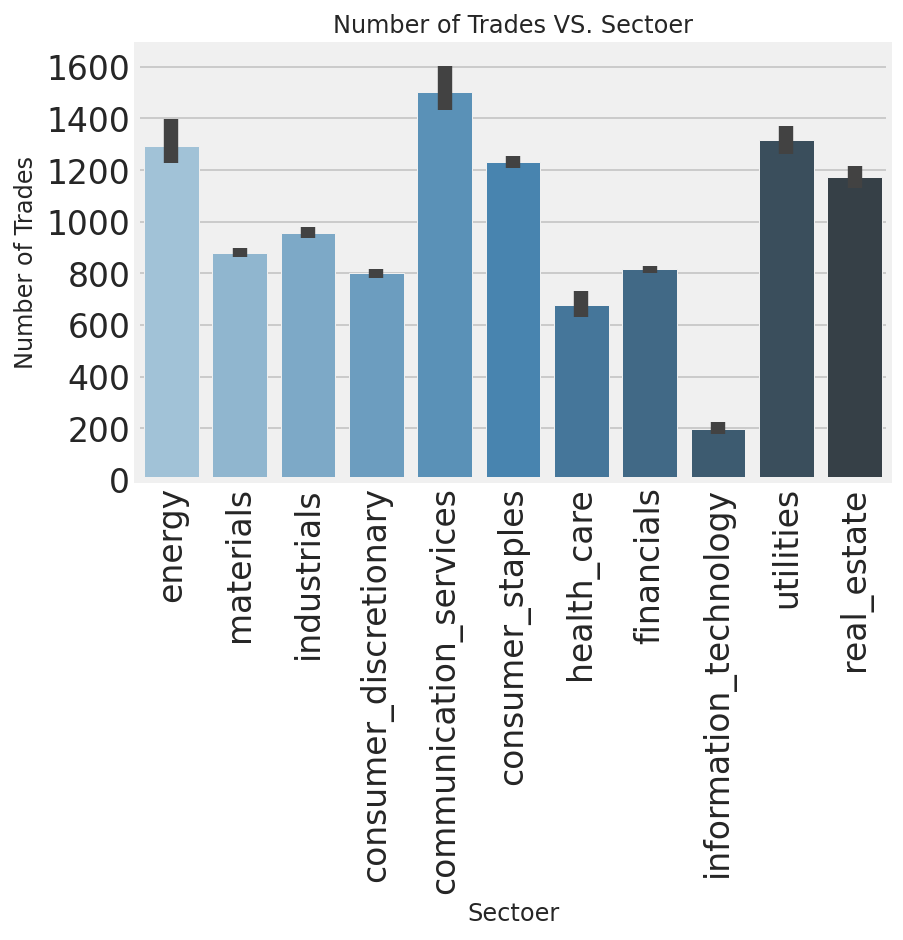

In [16]:
sns.barplot(x = 'sectoer',y='no_trades_',data=df, palette="Blues_d")
sns.set(rc={'figure.figsize':(16,10)})
plt.xticks(rotation=90)
plt.title('Number of Trades VS. Sectoer')
plt.xlabel('Sectoer')
plt.ylabel('Number of Trades')

**The purpose of the graph above is to compare the sectors by the No. of trades. From the graph, we choose Energy and communications sectors because they are the highest two.**

In [17]:
# To have the list of the companies in energy sector

energy = df[df['sectoer']=='energy']['trading_name_'].unique()
energy

array(['sarco', 'saudi_aramco', 'petro_rabigh', 'bahri', 'aldrees'],
      dtype=object)

In [18]:
configure_plotly_browser_state()
data = []
for asset in energy:
    asset_df = df[(df['trading_name_'] == asset)]

    data.append(go.Scatter(
        x = asset_df['date'],
        y = asset_df['close'].values,
        name = asset
    ))
layout = go.Layout(dict(title = "Closing Prices of Energy Sector",
                  xaxis = dict(title = 'Month'),
                  yaxis = dict(title = 'Price (SAR)'),
                  ))
py.iplot(dict(data=data, layout=layout), filename='basic-line')

**The purpose of the graph above is to show the history of the companies in the energy sector. We choose SARCO because it had better performance in 2006 and is one the oldest companies.**

In [19]:
# To have the list of the companies in communication services sector

cs = df[df['sectoer']=='communication_services']['trading_name_'].unique()
cs

array(['taprco', 'srmg', 'stc', 'etihad_etisalat', 'zain_ksa',
       'atheeb_telecom'], dtype=object)

In [20]:
configure_plotly_browser_state()
data = []
for asset in cs:
    asset_df = df[(df['trading_name_'] == asset)]

    data.append(go.Scatter(
        x = asset_df['date'],
        y = asset_df['close'].values,
        name = asset
    ))
layout = go.Layout(dict(title = "Closing Prices of Energy Sector",
                  xaxis = dict(title = 'Month'),
                  yaxis = dict(title = 'Price (SAR)'),
                  ))
py.iplot(dict(data=data, layout=layout), filename='basic-line')

**The purpose of the graph above is to show the history of the companies in the communication services sector. We choose STC because it is one of the oldest companies.**

In [21]:
# To have Seperate dataset for SARCO --> sort by date --> set date as index
sarco_df = df[df['trading_name_']=='sarco']
sarco_df['date']= pd.to_datetime(sarco_df['date'])
sarco_df.sort_values('date', inplace=True)
sarco_df = sarco_df.set_index('date')

# To have Seperate dataset for STC --> romove zero value --> sort by date --> set date as index
stc_df = df[df['trading_name_']=='stc']
stc_df.replace(to_replace = 0,  method='ffill', inplace=True)
stc_df['date']= pd.to_datetime(stc_df['date'])
stc_df.sort_values('date', inplace=True)
stc_df = stc_df.set_index('date')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-

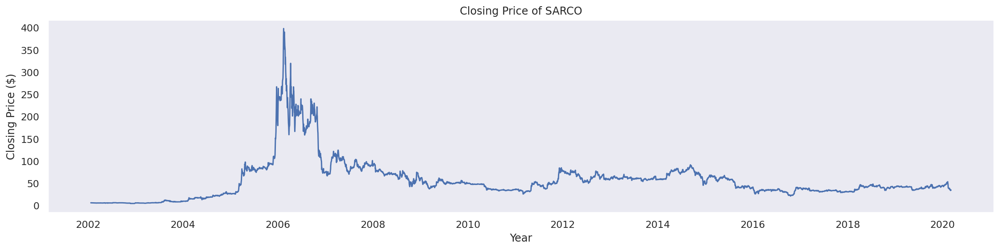

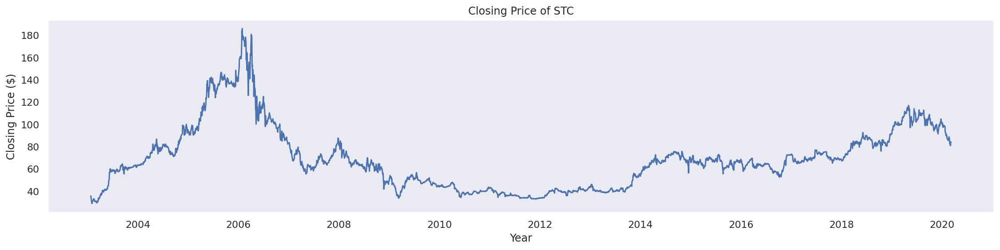

In [22]:
# To plot the historical price of SARCO
plt.figure(figsize=(17, 4))
plt.plot(sarco_df['close'])
plt.title('Closing Price of SARCO')
plt.ylabel('Closing Price ($)')
plt.xlabel('Year')
plt.grid(False)
plt.show()

# To plot the historical price of STC
plt.figure(figsize=(17, 4))
plt.plot(stc_df['close'])
plt.title('Closing Price of STC')
plt.ylabel('Closing Price ($)')
plt.xlabel('Year')
plt.grid(False)
plt.show()

**The purpose of the graphs above is to show the historical price of SARCO and STC.**

In [23]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [24]:
def plot_moving_average(series, window, plot_intervals=False, scale=1.96):

    rolling_mean = series.rolling(window = window).mean()
    resample_mean = series.resample('Y').mean()
    
    plt.figure(figsize=(17,6))
    plt.title('Moving Average for ')
    plt.plot(series[window:], label='Actual values')
    plt.plot(rolling_mean, 'g', label='Rolling mean trend window size = {}'.format(window) , linewidth=4.0)
    plt.plot(resample_mean, 'black', label='Yearly Resample mean trend')
    
    #Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bound = rolling_mean - (mae + scale * deviation)
        upper_bound = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
        plt.plot(lower_bound, 'r--')
            
    
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=5)    
    plt.grid(True)

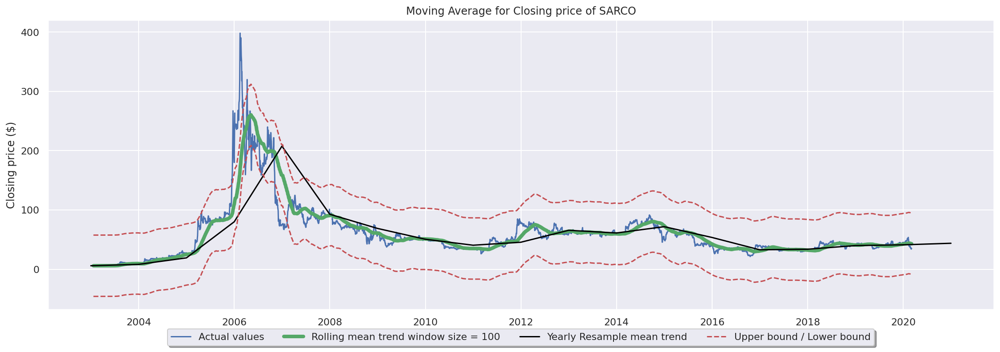

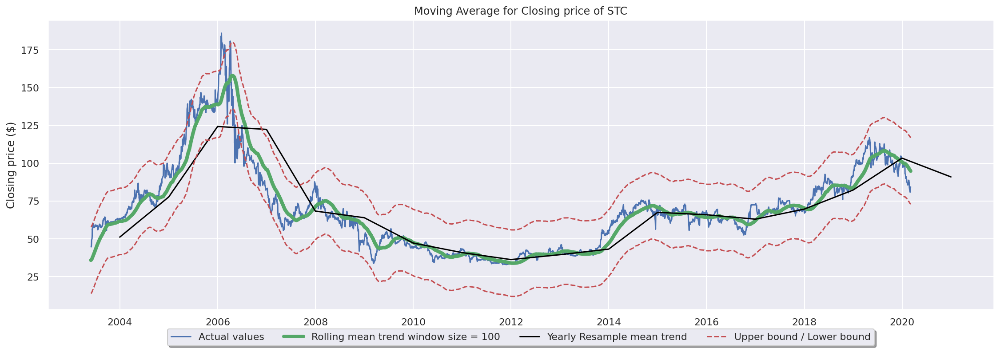

In [25]:
#Smooth by previous quarter (90 days)
plot_moving_average(sarco_df['close'], 100, plot_intervals=True)
plt.ylabel('Closing price ($)')
plt.title ('Moving Average for Closing price of SARCO');

#Smooth by previous quarter (90 days)
plot_moving_average(stc_df['close'], 100, plot_intervals=True)
plt.ylabel('Closing price ($)')
plt.title ('Moving Average for Closing price of STC');

**The purpose of the graphs above is to show the historical price of SARCO and STC with some Technical indicators like: (200 Envelope, Yearly Resample Mean Trand and 100 SMA)**

In [26]:
# To show the reason why the value of p-value is smaller than 0.05

print(BOLD + 'SARCO' +END)
result = adfuller(sarco_df['close'].dropna())
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
print('p_value < 0.05 , that means the series is stationary\n')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')
    
print('\n' + BOLD + 'STC' +END)
result = adfuller(stc_df['close'].dropna())
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
print('p_value < 0.05 , that means the series is stationary\n')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')    

SARCO
ADF Statistic: -2.620844819024631
p-value: 0.08876514059576435
p_value < 0.05 , that means the series is stationary

Critial Values:
   1%, -3.4318283318219898
Critial Values:
   5%, -2.862193244162659
Critial Values:
   10%, -2.567117725860559

STC
ADF Statistic: -1.8797187102643749
p-value: 0.3416613868262777
p_value < 0.05 , that means the series is stationary

Critial Values:
   1%, -3.4318363964938468
Critial Values:
   5%, -2.8621968068836514
Critial Values:
   10%, -2.567119622471385


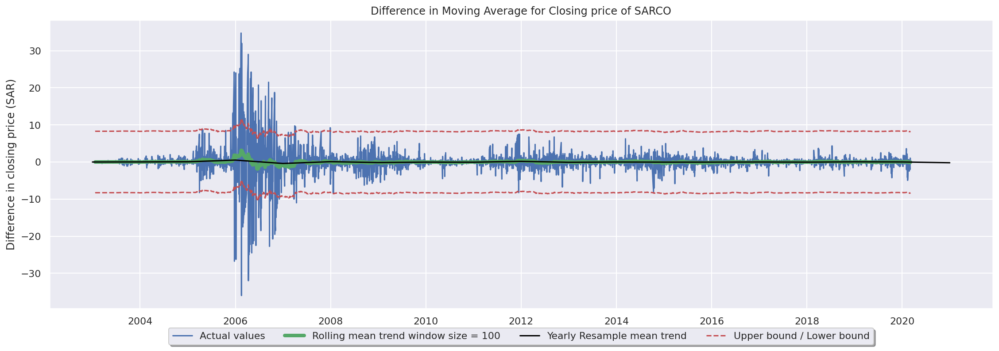

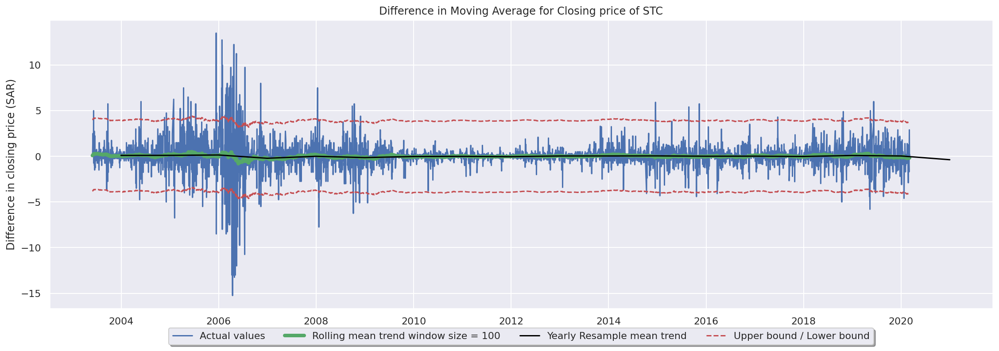

In [27]:
sarco_df['close_diff'] = sarco_df['close'].diff()
plot_moving_average(sarco_df['close_diff'], 100, plot_intervals=True)
plt.ylabel('Difference in closing price (SAR)')
plt.title ('Difference in Moving Average for Closing price of SARCO');

stc_df['close_diff'] = stc_df['close'].diff()
plot_moving_average(stc_df['close_diff'], 100, plot_intervals=True)
plt.ylabel('Difference in closing price (SAR)')
plt.title ('Difference in Moving Average for Closing price of STC');

**The purpose of the graphs above is to show the difference in Moving Average with the price of SARCO and STC which will show the distance between the moving the average and the price.**

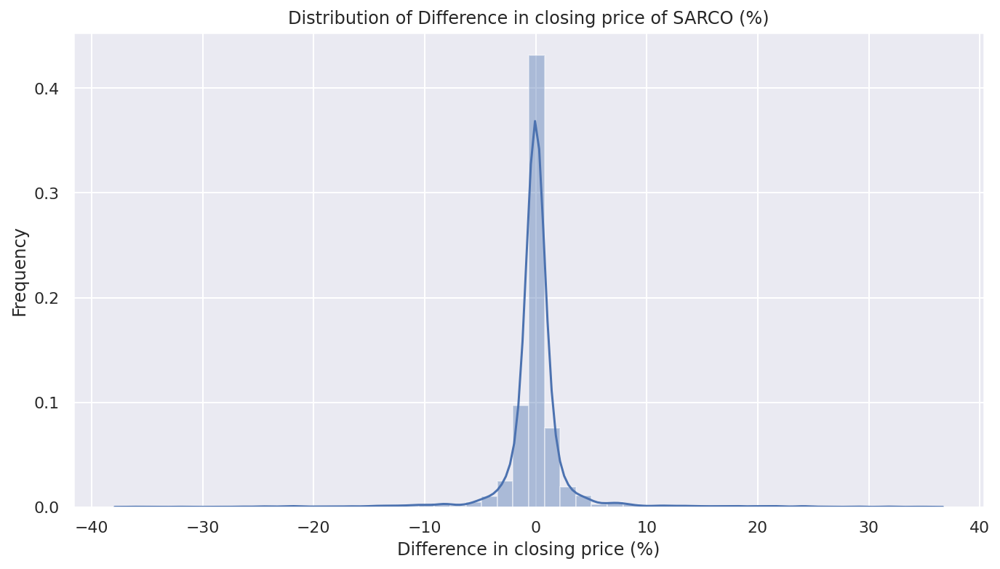

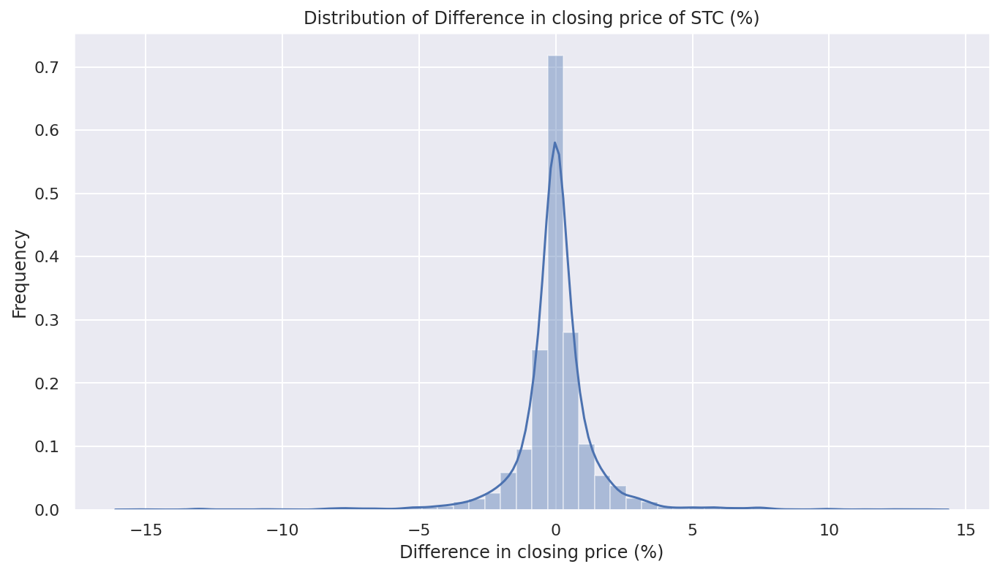

In [28]:
plt.figure(figsize=(10, 6))
sns.distplot(sarco_df['close_diff'].dropna())
plt.title('Distribution of Difference in closing price of SARCO (%)')
plt.ylabel('Frequency')
plt.xlabel('Difference in closing price (%)')
plt.show()

plt.figure(figsize=(10, 6))
sns.distplot(stc_df['close_diff'].dropna())
plt.title('Distribution of Difference in closing price of STC (%)')
plt.ylabel('Frequency')
plt.xlabel('Difference in closing price (%)')
plt.show()

**The purpose of the graphs above is to show the difference in closing proce the price of SARCO and STC. From the graph we can include the difference in closing for STC is less than SARCO. The reason is because SARCO reach almost 400 SAR while the price of STC reach almost 160 SAR.**

In [29]:
# apply Augmented Dickey Fuller Test (ADF Test)

print(BOLD + 'SARCO' +END)
result = adfuller(sarco_df['close_diff'].dropna())
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
print('p_value < 0.05 , that means the series is stationary\n')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

print('\n'+ BOLD + 'STC' +END)
result = adfuller(stc_df['close_diff'].dropna())
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
print('p_value < 0.05 , that means the series is stationary\n')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')    
    

SARCO
ADF Statistic: -13.60407652652587
p-value: 1.9283192245744306e-25
p_value < 0.05 , that means the series is stationary

Critial Values:
   1%, -3.431829000533984
Critial Values:
   5%, -2.8621935395791693
Critial Values:
   10%, -2.5671178831251695

STC
ADF Statistic: -12.86487418161787
p-value: 5.019877468933601e-24
p_value < 0.05 , that means the series is stationary

Critial Values:
   1%, -3.4318363964938468
Critial Values:
   5%, -2.8621968068836514
Critial Values:
   10%, -2.567119622471385


In [30]:
# function to plot autocorrelation

def autocorr_plots(y, lags=None):
    fig, ax = plt.subplots(ncols=2, figsize=(15, 4), sharey=True)
    plot_acf(y, lags=lags, ax=ax[0])
    plot_pacf(y, lags=lags, ax=ax[1])
    return fig, ax

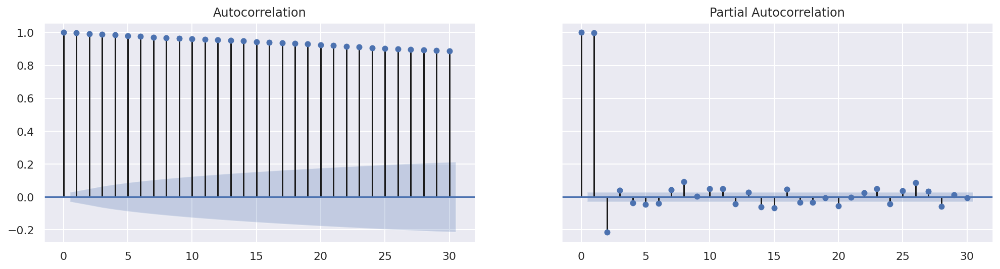

In [31]:
# plot autocorrelation for SARCO
fig, ax = autocorr_plots(sarco_df['close'],lags=30)

**The purpose of the graph above is to show the Autocorrelation and Partial Autocorrelation of SARCO to determine which types of ARIMA model.**

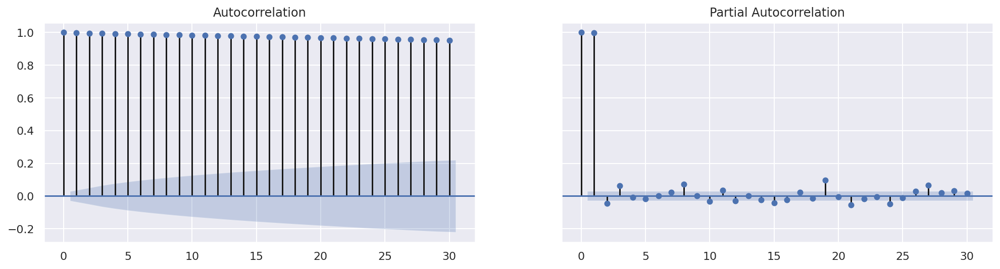

In [32]:
# plot autocorrelation for STC
fig, ax = autocorr_plots(stc_df['close'],lags=30)

**The purpose of the graph above is to show the Autocorrelation and Partial Autocorrelation of STC to determine which types of ARIMA model.**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



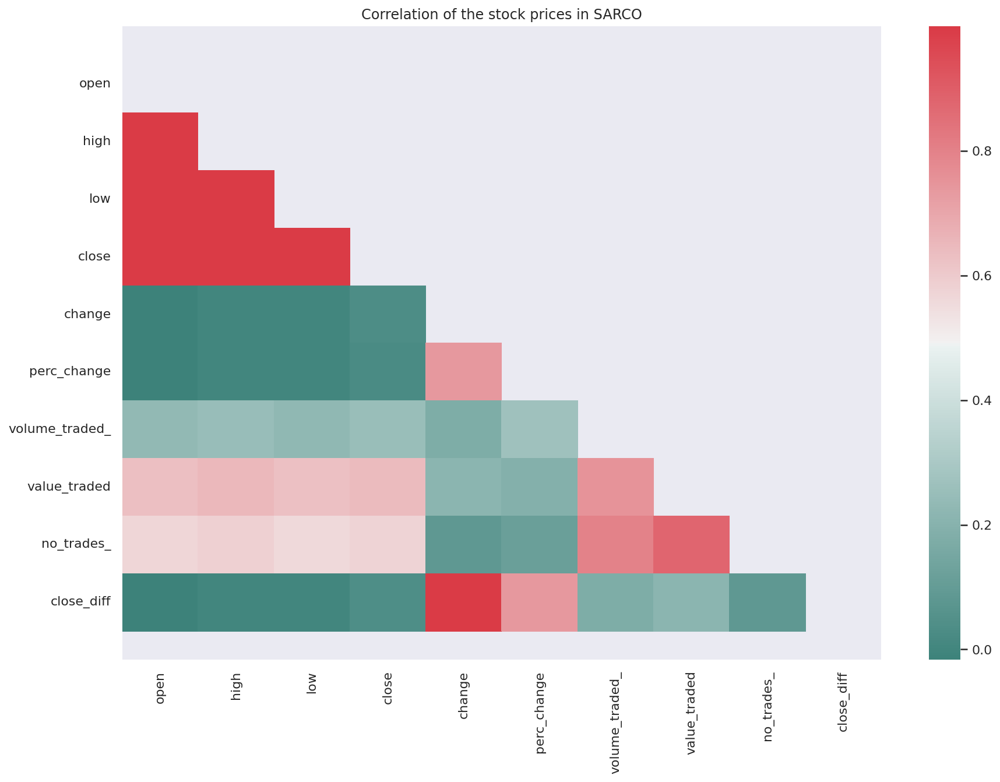

In [33]:
# To Plot the relation heatmap for SARCO

corr_CHEMICAL_df = sarco_df.drop('symbol', axis=1).corr()
fig, axs = plt.subplots(figsize = (13, 10)) 
mask = np.triu(np.ones_like(corr_CHEMICAL_df, dtype = np.bool))
sns.heatmap(corr_CHEMICAL_df, ax = axs, mask = mask, cmap = sns.diverging_palette(180, 10, as_cmap = True))
plt.title('Correlation of the stock prices in SARCO')

# fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.show()

**The purpose of the graph above is to show the relation between the columns of SARCO.**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



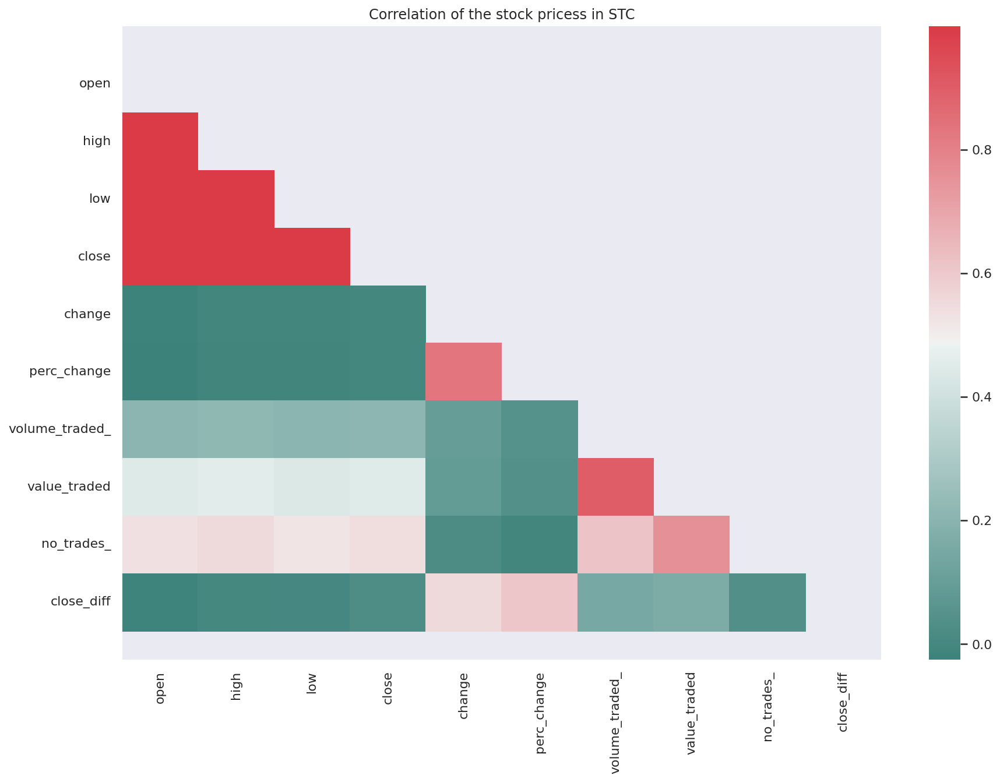

In [34]:
# To Plot the relation heatmap for STC

corr_SPIMACO_df = stc_df.drop('symbol', axis=1).corr()
fig, axs = plt.subplots(figsize = (13, 10)) 
mask = np.triu(np.ones_like(corr_SPIMACO_df, dtype = np.bool))
sns.heatmap(corr_SPIMACO_df, ax = axs, mask = mask, cmap = sns.diverging_palette(180, 10, as_cmap = True))
plt.title('Correlation of the stock pricess in STC')

# fix for mpl bug that cuts off top/bottom of seaborn viz
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.show()

**The purpose of the graph above is to show the relation between the columns of STC.**

# **-------------- Models and Machine Learning --------------**

# **ARIMA Model**

## *Preprocessing*

In [35]:
#copy of detaset
df_arima = df.copy()
df_arima

,symbol,name,trading_name_,sectoer,date,open,high,low,close,change,perc_change,volume_traded_,value_traded,no_trades_
0,2030,saudi_arabia_refineries_co.,sarco,energy,2020-03-05,35.55,35.85,34.90,34.90,-0.40,-1.13,436609.0,1.539907e+07,804.0
1,2030,saudi_arabia_refineries_co.,sarco,energy,2020-03-04,34.70,35.65,34.50,35.30,0.25,0.71,737624.0,2.598139e+07,1268.0
2,2030,saudi_arabia_refineries_co.,sarco,energy,2020-03-03,34.70,35.15,34.70,35.05,1.05,3.09,489831.0,1.711641e+07,854.0
3,2030,saudi_arabia_refineries_co.,sarco,energy,2020-03-02,35.20,35.65,34.00,34.00,-0.55,-1.59,736157.0,2.585870e+07,1242.0
4,2030,saudi_arabia_refineries_co.,sarco,energy,2020-03-01,35.35,35.60,34.25,34.55,-2.05,-5.60,738685.0,2.574797e+07,1625.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
593814,4321,arabian_centres_co.,almrakez,real_estate,2019-05-28,22.90,22.90,21.62,22.50,0.00,0.00,1860532.0,4.149566e+07,2023.0
593815,4321,arabian_centres_co.,almrakez,real_estate,2019-05-27,23.30,23.32,22.24,22.50,-0.84,-3.60,4905676.0,1.114168e+08,3259.0
593816,4321,arabian_centres_co.,almrakez,real_estate,2019-05-26,24.60,24.60,23.30,23.34,-1.16,-4.73,3908215.0,9.269862e+07,2672.0
593817,4321,arabian_centres_co.,almrakez,real_estate,2019-05-23,24.80,25.00,24.34,24.50,-0.50,-2.00,4078214.0,1.002221e+08,5571.0


In [36]:
# checking the type of the date
df_arima.dtypes

symbol              int64
name               object
trading_name_      object
sectoer            object
date               object
open              float64
high              float64
low               float64
close             float64
change            float64
perc_change       float64
volume_traded_    float64
value_traded      float64
no_trades_        float64
dtype: object

In [37]:
#Create a datetime index

df_arima['date'] = pd.to_datetime(df_arima.date)

In [38]:
# set date as index

df_arima.set_index('date', inplace=True, drop=True)

In [39]:
# filter the dataframe with to get SARCO company data

company =df_arima[df_arima['trading_name_'] == 'sarco']

In [40]:
# drop the nunnumeric features

company=company.drop(['symbol','name','trading_name_','sectoer'], axis=1)

In [41]:
# print the SARCO company data

company

,open,high,low,close,change,perc_change,volume_traded_,value_traded,no_trades_
date,,,,,,,,,
2020-03-05,35.55,35.85,34.90,34.90,-0.40,-1.13,436609.0,15399073.50,804.0
2020-03-04,34.70,35.65,34.50,35.30,0.25,0.71,737624.0,25981391.35,1268.0
2020-03-03,34.70,35.15,34.70,35.05,1.05,3.09,489831.0,17116413.40,854.0
2020-03-02,35.20,35.65,34.00,34.00,-0.55,-1.59,736157.0,25858700.60,1242.0
2020-03-01,35.35,35.60,34.25,34.55,-2.05,-5.60,738685.0,25747967.55,1625.0
...,...,...,...,...,...,...,...,...,...
2002-03-13,5.90,NaN,NaN,5.90,0.00,0.00,1125.0,6600.00,1.0
2002-03-11,5.80,5.90,5.90,5.90,0.10,1.72,37500.0,220000.00,1.0
2002-03-09,5.80,NaN,NaN,5.80,0.00,0.00,75.0,435.00,1.0


## *Stationarity*

In [42]:
#Ho: It is a non-stationary (null hypothesis) 
#H1: It is stationary (Alternative Hypothesis)

def adfuller_test(close):
    result=adfuller(close)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

In [43]:
# Test Statistic for Sarco company
adfuller_test(company['close'])

ADF Test Statistic : -2.3883547317978358
p-value : 0.14505021142566632
#Lags Used : 31
Number of Observations Used : 4426
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


## *Differencing*

In [44]:
#creat new colomn
company= pd.DataFrame(company)
company['diff_1'] = company['close'].diff(1)

In [45]:
#To show the head of dataset
company.head()

,open,high,low,close,change,perc_change,volume_traded_,value_traded,no_trades_,diff_1
date,,,,,,,,,,
2020-03-05,35.55,35.85,34.90,34.90,-0.40,-1.13,436609.0,15399073.50,804.0,NaN
2020-03-04,34.70,35.65,34.50,35.30,0.25,0.71,737624.0,25981391.35,1268.0,0.40
2020-03-03,34.70,35.15,34.70,35.05,1.05,3.09,489831.0,17116413.40,854.0,-0.25
2020-03-02,35.20,35.65,34.00,34.00,-0.55,-1.59,736157.0,25858700.60,1242.0,-1.05
2020-03-01,35.35,35.60,34.25,34.55,-2.05,-5.60,738685.0,25747967.55,1625.0,0.55


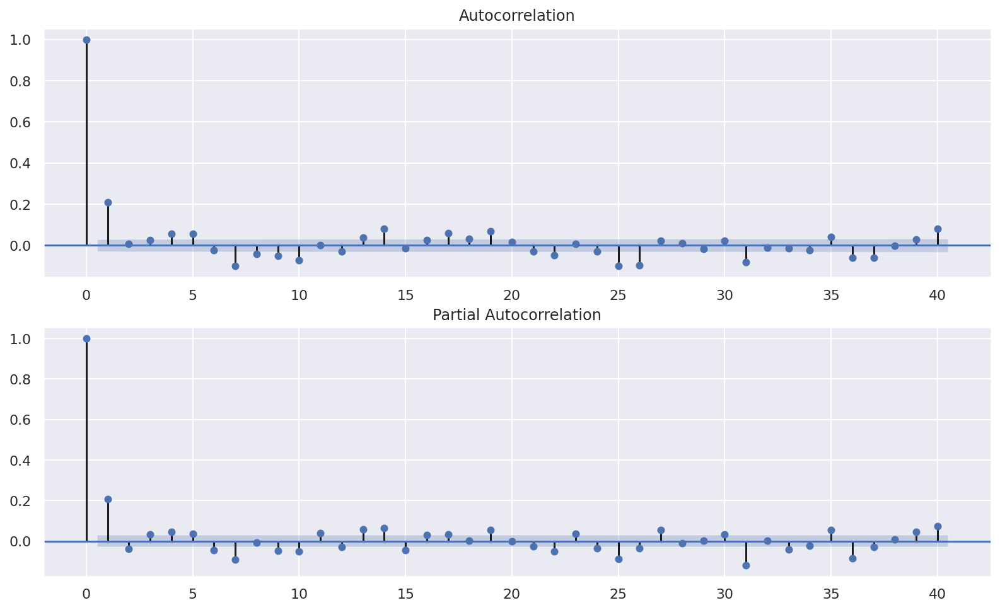

In [46]:
# ACF, PACF graphs to help determine order of ARIMA model, again statsmodel has these handy functions built-in
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(company['diff_1'][1:], lags=40, ax=ax1)   # first value of diff is NaN
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(company['diff_1'][1:], lags=40, ax=ax2)

## *Checking The Min & Max Date*

In [47]:
# checking the min & max date
company.index.max(), company.index.min()

(Timestamp('2020-03-05 00:00:00'), Timestamp('2002-01-23 00:00:00'))

In [48]:
# To show the dataset
df_arima

,symbol,name,trading_name_,sectoer,open,high,low,close,change,perc_change,volume_traded_,value_traded,no_trades_
date,,,,,,,,,,,,,
2020-03-05,2030,saudi_arabia_refineries_co.,sarco,energy,35.55,35.85,34.90,34.90,-0.40,-1.13,436609.0,1.539907e+07,804.0
2020-03-04,2030,saudi_arabia_refineries_co.,sarco,energy,34.70,35.65,34.50,35.30,0.25,0.71,737624.0,2.598139e+07,1268.0
2020-03-03,2030,saudi_arabia_refineries_co.,sarco,energy,34.70,35.15,34.70,35.05,1.05,3.09,489831.0,1.711641e+07,854.0
2020-03-02,2030,saudi_arabia_refineries_co.,sarco,energy,35.20,35.65,34.00,34.00,-0.55,-1.59,736157.0,2.585870e+07,1242.0
2020-03-01,2030,saudi_arabia_refineries_co.,sarco,energy,35.35,35.60,34.25,34.55,-2.05,-5.60,738685.0,2.574797e+07,1625.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-05-28,4321,arabian_centres_co.,almrakez,real_estate,22.90,22.90,21.62,22.50,0.00,0.00,1860532.0,4.149566e+07,2023.0
2019-05-27,4321,arabian_centres_co.,almrakez,real_estate,23.30,23.32,22.24,22.50,-0.84,-3.60,4905676.0,1.114168e+08,3259.0
2019-05-26,4321,arabian_centres_co.,almrakez,real_estate,24.60,24.60,23.30,23.34,-1.16,-4.73,3908215.0,9.269862e+07,2672.0


## *Split* 

In [49]:
#Function To spilit dataset
def split_train_test(data):
    data_test=pd.DataFrame(data['close'][0:int(len(data)*0.15)])
    data_train=pd.DataFrame(data['close'][int(len(data_test)):int(len(data)*0.99)])
    print(data_test.shape, data_train.shape)
    return data_test , data_train

In [50]:
#To spilit dataset
df_test , df_train = split_train_test(company)

(668, 1) (3745, 1)


In [51]:
# To show the shape of the training dataset and test dataset
df_train.shape , df_test.shape

((3745, 1), (668, 1))

In [52]:
# printing df_train 
df_train

,close
date,
2017-07-04,31.86
2017-07-03,32.39
2017-07-02,32.09
2017-06-22,31.90
2017-06-21,31.87
...,...
2002-08-11,6.10
2002-08-10,6.10
2002-08-04,6.50


In [53]:
# printing df_test 
df_test

,close
date,
2020-03-05,34.90
2020-03-04,35.30
2020-03-03,35.05
2020-03-02,34.00
2020-03-01,34.55
...,...
2017-07-11,33.00
2017-07-10,33.27
2017-07-09,33.38


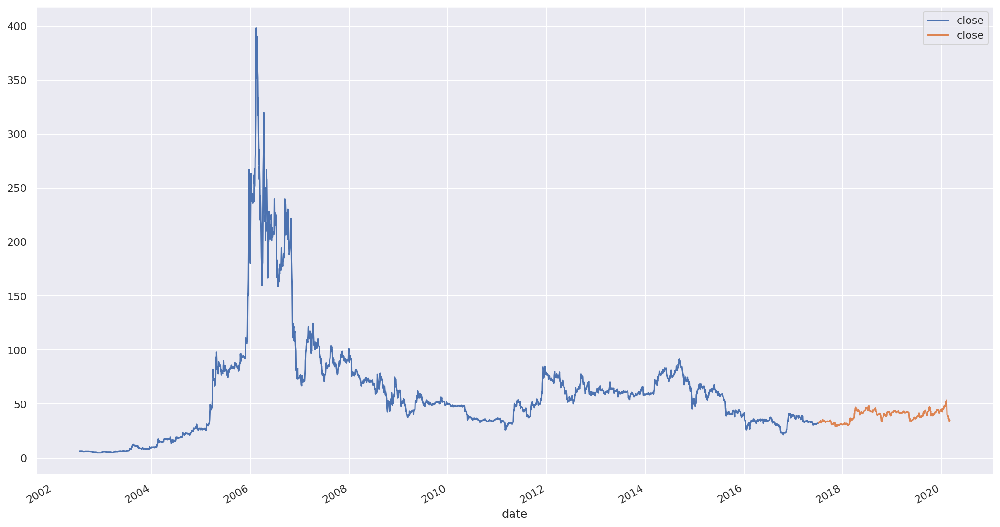

In [54]:
# Plot the train and test sets on the axis ax
fig, ax = plt.subplots()
df_train.plot(ax=ax)
df_test.plot(ax=ax)
plt.show()

In [55]:
# # let's keep that as a variable for later

# drop the null value from train dataset
urate_train = df_train
udiff_train = urate_train.diff().dropna()

## drop the null value from test dataset
urate_test = df_test
udiff_test = urate_test.diff().dropna()

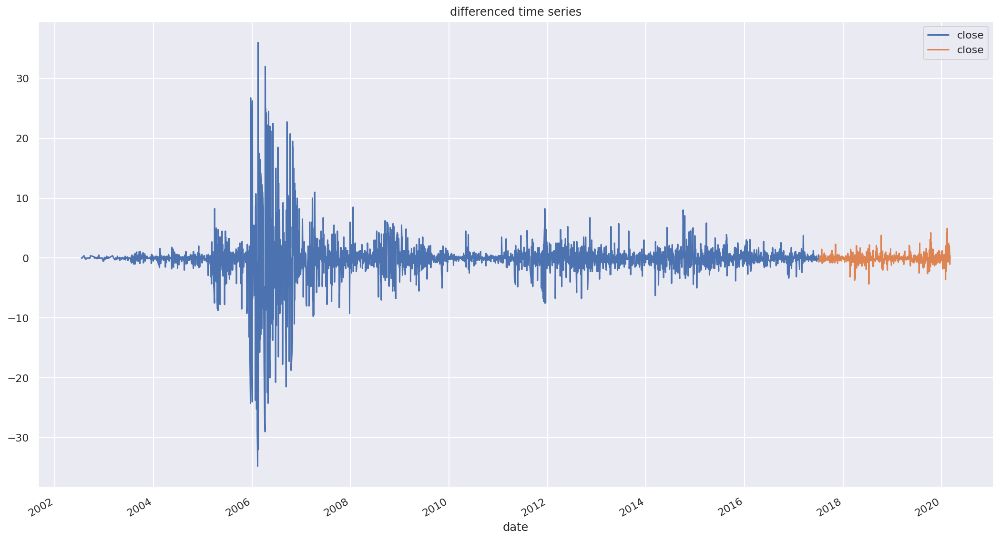

In [56]:
# Plot the differenced time series
fig, ax = plt.subplots()
udiff_train.plot(ax=ax)
udiff_test.plot(ax=ax)
plt.title('differenced time series')
plt.show()

## *Apply ARIMA Model*

In [57]:
# create training and test dataset without null
df_train = df_train.dropna()
df_test = df_test.dropna()

In [58]:
# indexing the train dataset
df_train.index = pd.DatetimeIndex(df_train.index).to_period('D')

In [59]:
# For non-seasonal data
#p=1, d=1, q=0 or 1

# p— the number of autoregressive
# d — degree of differencing
# q — the number of moving average terms
# m — refers to the number of periods in each season
# (P, D, Q )— represents the (p,d,q) for the seasonal part of the time series

In [60]:

# ARIMA(p,d,q) forecasting equation
# ARIMA(1,0,0) = first-order autoregressive model
# ARIMA(0,1,0) = random walk
# ARIMA(1,1,0) = differenced first-order autoregressive model
# ARIMA(0,1,1) without constant = simple exponential smoothing
# ARIMA(0,1,1) with constant = simple exponential smoothing with growth
# ARIMA(0,2,1) or (0,2,2) without constant = linear exponential smoothing
# ARIMA(1,1,2) with constant = damped-trend linear exponential smoothing
# Spreadsheet implementation

In [61]:
# using auto_arima to find the best order for p, d , q

model = pm.auto_arima(df_train, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=20356.768, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=20527.684, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=20362.375, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=20354.769, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=20525.696, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=20356.768, Time=0.58 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=20356.785, Time=2.19 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=20352.777, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=20354.776, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=20354.776, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=20360.383, Time=0.12 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=20354.798, Time=0.56 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 5.517 seconds
                               SARIMAX Results                              

In [62]:
#AR model 
#If there is a Positive autocorrelation at lag 1 then we use the AR model
ar = ARIMA(df_train,
              order= (0,1,1))
result = ar.fit()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:222: ValueWarning:

A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:222: ValueWarning:

A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:222: ValueWarning:

A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.



In [63]:
#Summary Result
print(result.summary())

                               SARIMAX Results                                
Dep. Variable:                  close   No. Observations:                 3745
Model:                 ARIMA(0, 1, 1)   Log Likelihood              -10174.389
Date:                Thu, 08 Sep 2022   AIC                          20352.777
Time:                        01:43:31   BIC                          20365.233
Sample:                             0   HQIC                         20357.207
                               - 3745                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2188      0.004     52.922      0.000       0.211       0.227
sigma2        13.4254      0.082    163.580      0.000      13.264      13.586
Ljung-Box (Q):                      321.36   Jarque-

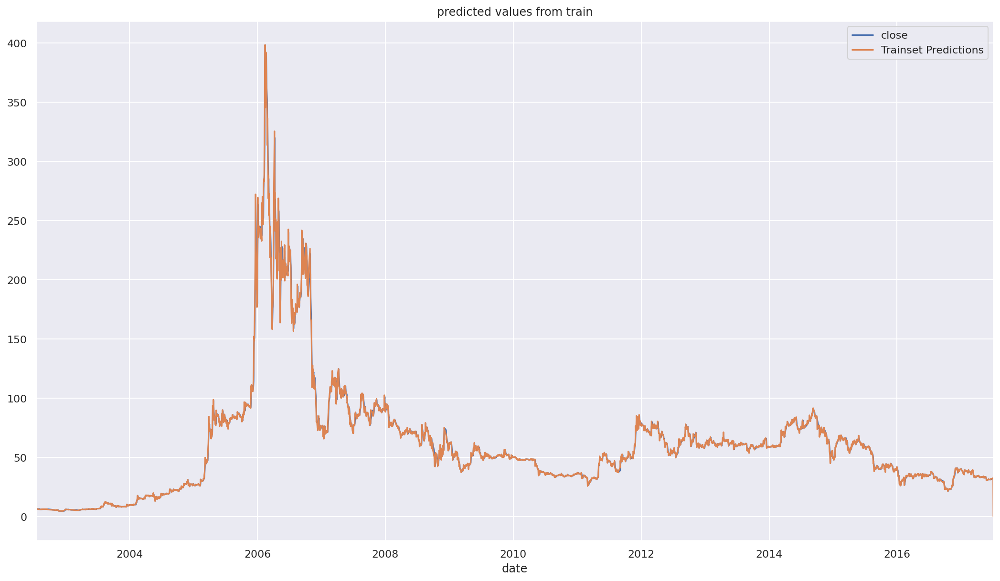

In [64]:
#  predicted values from train
result.fittedvalues.head()

# plot our prediction for train data
df_train.plot(legend = True)
result.fittedvalues.rename("Trainset Predictions").plot(legend = True)
plt.title('predicted values from train')
plt.show()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



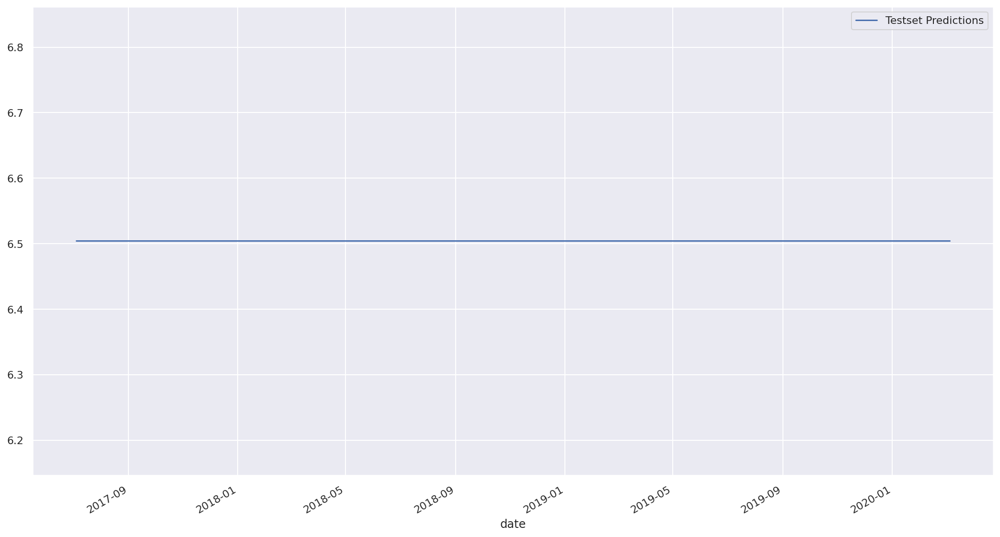

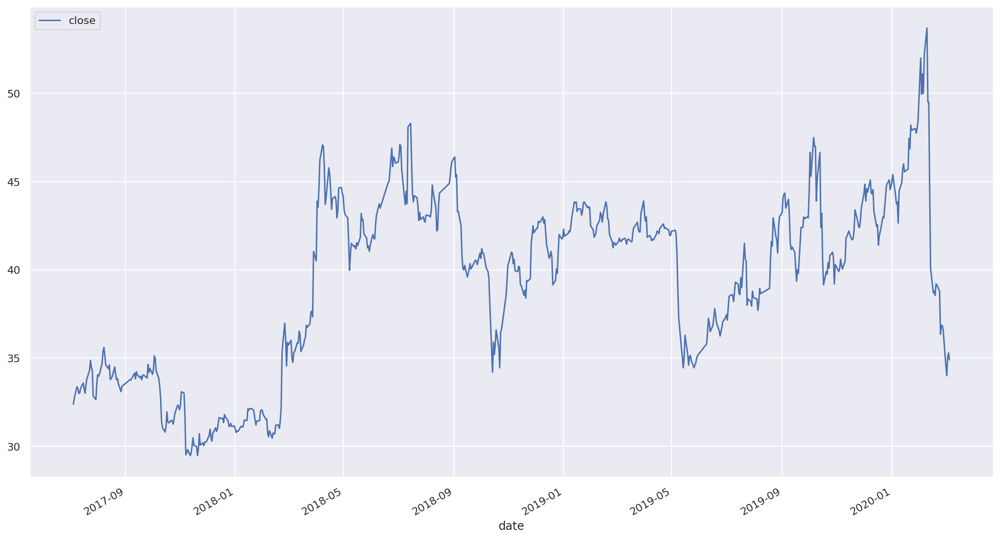

In [65]:
# plot our prediction for test data

start = len(df_train)
end = len(df_train) + len(df_test) -1

# # Predictions for the test set
predictions = result.predict(start, end).rename("Testset Predictions")

# set the index to match the df_test index

predictions=pd.DataFrame(predictions)
predictions.set_index(df_test.index,inplace=True)
# Then plot
predictions.plot(legend = True)
df_test.plot(legend = True);

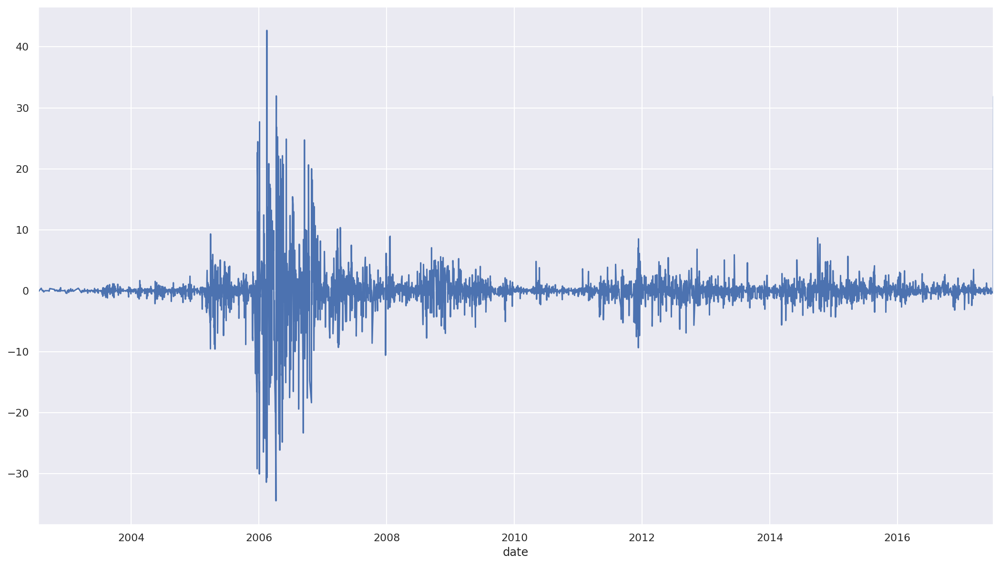

In [66]:
#the mean squared error of the predictions 
#print('MSE statsmodels:\t', result.sigma2)
result.resid.plot()

In [67]:
predictions

,Testset Predictions
date,
2020-03-05,6.504189
2020-03-04,6.504189
2020-03-03,6.504189
2020-03-02,6.504189
2020-03-01,6.504189
...,...
2017-07-11,6.504189
2017-07-10,6.504189
2017-07-09,6.504189


In [68]:
mae_arima = mean_absolute_error(y_true=df_test, y_pred=predictions)
mse_arima = mean_squared_error(df_test, predictions)
r2_arima  = r2_score(df_test, predictions)

In [69]:
print("The model performance for testing set")
print("--------------------------------------")
print('MAE is {}'.format(mae_arima))
print('MSE is {}'.format(mse_arima))
print('R2 score is {}'.format(r2_arima))

The model performance for testing set
--------------------------------------
MAE is 32.81452353988375
MSE is 1101.5549639711633
R2 score is -43.48568659789965


# **LSTM Model**

## *Preprocessing*

In [150]:
#copy of dataset
df_lstm = df.copy()
df_lstm

,symbol,name,trading_name_,sectoer,date,open,high,low,close,change,perc_change,volume_traded_,value_traded,no_trades_
0,2030,saudi_arabia_refineries_co.,sarco,energy,2020-03-05,35.55,35.85,34.90,34.90,-0.40,-1.13,436609.0,1.539907e+07,804.0
1,2030,saudi_arabia_refineries_co.,sarco,energy,2020-03-04,34.70,35.65,34.50,35.30,0.25,0.71,737624.0,2.598139e+07,1268.0
2,2030,saudi_arabia_refineries_co.,sarco,energy,2020-03-03,34.70,35.15,34.70,35.05,1.05,3.09,489831.0,1.711641e+07,854.0
3,2030,saudi_arabia_refineries_co.,sarco,energy,2020-03-02,35.20,35.65,34.00,34.00,-0.55,-1.59,736157.0,2.585870e+07,1242.0
4,2030,saudi_arabia_refineries_co.,sarco,energy,2020-03-01,35.35,35.60,34.25,34.55,-2.05,-5.60,738685.0,2.574797e+07,1625.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
593814,4321,arabian_centres_co.,almrakez,real_estate,2019-05-28,22.90,22.90,21.62,22.50,0.00,0.00,1860532.0,4.149566e+07,2023.0
593815,4321,arabian_centres_co.,almrakez,real_estate,2019-05-27,23.30,23.32,22.24,22.50,-0.84,-3.60,4905676.0,1.114168e+08,3259.0
593816,4321,arabian_centres_co.,almrakez,real_estate,2019-05-26,24.60,24.60,23.30,23.34,-1.16,-4.73,3908215.0,9.269862e+07,2672.0
593817,4321,arabian_centres_co.,almrakez,real_estate,2019-05-23,24.80,25.00,24.34,24.50,-0.50,-2.00,4078214.0,1.002221e+08,5571.0


In [151]:
#set index for locating companies
trading_name_index_cs=df_lstm.set_index("trading_name_")
trading_name_index_cs.dtypes

symbol              int64
name               object
sectoer            object
date               object
open              float64
high              float64
low               float64
close             float64
change            float64
perc_change       float64
volume_traded_    float64
value_traded      float64
no_trades_        float64
dtype: object

In [152]:
# checking the type of the date
df_lstm.dtypes

symbol              int64
name               object
trading_name_      object
sectoer            object
date               object
open              float64
high              float64
low               float64
close             float64
change            float64
perc_change       float64
volume_traded_    float64
value_traded      float64
no_trades_        float64
dtype: object

In [153]:
# creates an array of company names
uniqueVals_cs = df_lstm["trading_name_"].unique() 
# appends the results of all companies
grouped_df_cs=pd.DataFrame()  # empty dataframe
for i in uniqueVals_cs:
    # store DataFrame in list
    grouped_df_cs=grouped_df_cs.append((trading_name_index_cs.loc[i,:]).groupby(['trading_name_','date']).mean())
uniqueVals_cs

array(['sarco', 'saudi_aramco', 'petro_rabigh', 'bahri', 'aldrees',
       'takween', 'mepco', 'bci', 'maaden', 'aslak', 'alyamamah_steel',
       'ssp', 'chemanol', 'petrochem', 'sabic', 'safco', 'tasnee', 'ngc',
       'zoujaj', 'alujain', 'fipco', 'apc', 'nama_chemicals',
       'maadaniyah', 'zamil_indust', 'siig', 'yansab', 'spm', 'sipchem',
       'advanced', 'saudi_kayan', 'hcc', 'najran_cement', 'city_cement',
       'northern_cement', 'uacc', 'oasis', 'alkathiri', 'acc', 'yscc',
       'saudi_cement', 'qacco', 'spcc', 'ycc', 'epcco', 'tcc',
       'jouf_cement', 'astra_industrial', 'bawan', 'eic', 'alkhodari',
       'saudi_ceramics', 'saudi_cable', 'adc', 'amiantit', 'albabtain',
       'svcp', 'mesc', 'sieco', 'maharah', 'sppc', 'catering', 'sisco',
       'sgs', 'saptco', 'batic', 'budget_saudi', 'alsorayai_group',
       'sidc', 'alabdullatif', 'lazurde', 'alaseel', 'fitaihi_group',
       'seera', 'alhokair_group', 'fitness_time', 'dur', 'teco',
       'alkhaleej_trng', '

In [154]:
# filter the data frame to get Stc company data
grouped_STC = (grouped_df_cs.loc["stc",:]).reset_index()
grouped_STC.round(2).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4433 entries, 0 to 4432
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   date            4433 non-null   object 
 1   symbol          4433 non-null   int64  
 2   open            4431 non-null   float64
 3   high            4431 non-null   float64
 4   low             4431 non-null   float64
 5   close           4433 non-null   float64
 6   change          4433 non-null   float64
 7   perc_change     4433 non-null   float64
 8   volume_traded_  4433 non-null   float64
 9   value_traded    4433 non-null   float64
 10  no_trades_      4433 non-null   float64
dtypes: float64(9), int64(1), object(1)
memory usage: 381.1+ KB


In [155]:
#Function to do feature_select
def feature_select(data):
    data=data.filter(['date','change','close','value_traded','no_trades_'], axis=1)
    date_index=data.set_index("date")
    return date_index

In [156]:
#call the function
date_index3=feature_select(grouped_STC)

In [157]:
date_index3

,change,close,value_traded,no_trades_
date,,,,
2003-01-25,35.75,35.75,1.520917e+09,6369.0
2003-01-26,-0.75,35.00,6.621076e+08,4179.0
2003-01-27,-1.50,33.50,7.221220e+08,5128.0
2003-01-28,-0.25,33.25,1.708552e+08,3003.0
2003-01-29,-1.75,31.50,2.894504e+08,3563.0
...,...,...,...,...
2020-03-01,-1.70,80.90,1.079029e+08,2826.0
2020-03-02,0.30,81.20,1.029203e+08,3817.0
2020-03-03,2.90,84.10,9.418839e+07,2972.0


## *Split Train & Test*

In [158]:
#Function To spilit dataset
def split_train_test(data):
    data_train=pd.DataFrame(data['close'][0:int(len(data)*0.80)])
    data_test=pd.DataFrame(data['close'][int(len(data)*0.80):int(len(data))])
    print(data_train.shape, data_test.shape)
    return data_train , data_test

In [159]:
#call function
data_train3 , data_test3 = split_train_test(date_index3)

(3546, 1) (887, 1)


## *Min Max Scaler*

In [160]:
#Transform to do normalization
MMS = MinMaxScaler(feature_range=(0,1))
data_train_MMS3 = MMS.fit_transform(data_train3)

## *Split Train*

In [161]:
#Function To spilit Train dataset to x and y 
def split_train(data_train_MMS):
    x_train=[]
    y_train=[]

    #split feature and target
    for i in range(180,data_train_MMS.shape[0]):
        x_train.append(data_train_MMS[i-180:i])
        y_train.append(data_train_MMS[i,0])

    x_train,y_train=np.array(x_train),np.array(y_train)
    return x_train , y_train

In [162]:
#call function
x_train3, y_train3 = split_train(data_train_MMS3)
x_train3.shape

(3366, 180, 1)

In [163]:
X_train3, X_validate3, Y_train3, Y_validate3 = train_test_split(x_train3 , y_train3, test_size = 0.1)

## *Apply LSTM Model*

In [164]:
#Apply LSTM model

lstm=Sequential()
#layers

#(x_train.shape[1],1)--->shape[1]'(it is my 180 days)',1 (it is my close)
lstm.add(LSTM(units=50,activation='relu',return_sequences=True,input_shape=(x_train3.shape[1],1)))
lstm.add(Dropout(0.2))

#layer-2
lstm.add(LSTM(units=60,activation='relu',return_sequences=True))
lstm.add(Dropout(0.3))

#layer-3
lstm.add(LSTM(units=80,activation='relu',return_sequences=True))
lstm.add(Dropout(0.4))

#layer-4
lstm.add(LSTM(units=120,activation='relu'))
lstm.add(Dropout(0.5))

#connect the layers
lstm.add(Dense(units=1))

In [165]:
#Result summary
lstm.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 180, 50)           10400     
                                                                 
 dropout_8 (Dropout)         (None, 180, 50)           0         
                                                                 
 lstm_9 (LSTM)               (None, 180, 60)           26640     
                                                                 
 dropout_9 (Dropout)         (None, 180, 60)           0         
                                                                 
 lstm_10 (LSTM)              (None, 180, 80)           45120     
                                                                 
 dropout_10 (Dropout)        (None, 180, 80)           0         
                                                                 
 lstm_11 (LSTM)              (None, 120)              

In [85]:
#run model then we save model 

#lstm.compile(optimizer='adam',loss='mean_squared_error',metrics =['accuracy'])
#lstm.fit(x_train3,y_train3, epochs = 50, verbose = 1, validation_data = (X_validate3, Y_validate3))
#lstm.save('KSA_STC_Stocks_LSTM_model.h5')

Epoch 1/50
106/106 [==============================] - 40s 345ms/step - loss: 0.0145 - accuracy: 5.9418e-04 - val_loss: 0.0012 - val_accuracy: 0.0000e+00
Epoch 2/50
106/106 [==============================] - 37s 346ms/step - loss: 0.0050 - accuracy: 5.9418e-04 - val_loss: 6.9209e-04 - val_accuracy: 0.0000e+00
Epoch 3/50
106/106 [==============================] - 36s 340ms/step - loss: 0.0046 - accuracy: 2.9709e-04 - val_loss: 4.6777e-04 - val_accuracy: 0.0000e+00
Epoch 4/50
106/106 [==============================] - 36s 340ms/step - loss: 0.0040 - accuracy: 5.9418e-04 - val_loss: 0.0011 - val_accuracy: 0.0000e+00
Epoch 5/50
106/106 [==============================] - 37s 348ms/step - loss: 0.0032 - accuracy: 5.9418e-04 - val_loss: 7.9788e-04 - val_accuracy: 0.0000e+00
Epoch 6/50
106/106 [==============================] - 36s 341ms/step - loss: 0.0033 - accuracy: 2.9709e-04 - val_loss: 0.0012 - val_accuracy: 0.0000e+00
Epoch 7/50
106/106 [==============================] - 36s 342ms/step -

AttributeError: ignored

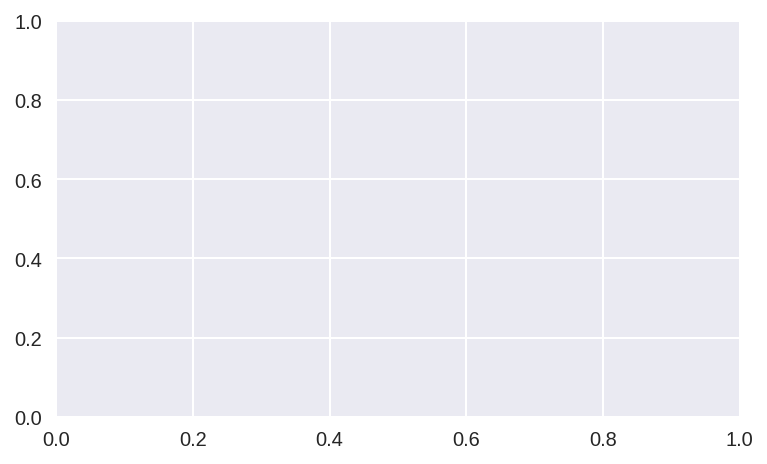

In [175]:
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(lstm.history.history['loss'], label='Loss')
plt.plot(lstm.history.history['val_loss'], label='val_Loss')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.title('Loss evolution')

plt.subplot(2, 2, 2)
plt.plot(lstm.history.history['accuracy'], label='accuracy')
plt.plot(lstm.history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.title('Accuracy evolution')

In [174]:
#load the model 
lstm=load_model("KSA_STC_Stocks_LSTM_model.h5")

In [167]:
#Function To spilit Test dataset to x and y

def split_test(data_train,data_test):
    MMS = MinMaxScaler(feature_range=(0,1))
    #get the last 180 day to pridict 
    last_180_days=data_train.tail(180)

    #test data
    final_df=last_180_days.append(data_test,ignore_index=True)

    final_df_MMS = MMS.fit_transform(final_df)
    final_df_MMS
    x_test=[]
    y_test=[]

    #split feature and target
    for i in range(180,final_df_MMS.shape[0]):
        x_test.append(final_df_MMS[i-180:i])
        y_test.append(final_df_MMS[i,0])

    x_test,y_test=np.array(x_test),np.array(y_test)
    print(x_test.shape)
    print(y_test.shape)

    return x_test , y_test

In [168]:
#call the function
x_test3 , y_test3 = split_test(data_train3,data_test3)

(887, 180, 1)
(887,)


## *Result*

In [169]:
#predection 
y_predicted3=lstm.predict(x_test3)

In [172]:
#Results
mea_lstm = mean_absolute_error(y_true=y_test3, y_pred=y_predicted3)
mse_lstm = mean_squared_error(y_test3, y_predicted3)
r2_lstm  = r2_score(y_test3, y_predicted3)

In [173]:
print("The model performance for testing set")
print("--------------------------------------")
print('MAE is {}'.format(mea_lstm))
print('MSE is {}'.format(mse_lstm))
print('R2 score is {}'.format(r2_lstm))

The model performance for testing set
--------------------------------------
MAE is 0.04515116784106228
MSE is 0.0035657933304117564
R2 score is 0.9389658078613315


## *Evaluating*

In [95]:
# Function for evaluating regression models

def reg_cost(method, actual, preds):
    mae = mean_absolute_error(y_true=actual, y_pred=preds)
    mse = mean_squared_error(y_true=actual, y_pred=preds)
    
    print(f'Cost functions for the {method} regression is:')
    print(f'Mean Square Error: {round(mse,4)}')
    print(f'Mean Absolute Error: {round(mae,4)}\n\n')

In [96]:
# print result

model_name3 = ['LSTM']
model_pred3 = [y_predicted3]

for x in range(len(model_pred3)):
    
    reg_cost(model_name3[x],y_test3, model_pred3[x] )

Cost functions for the LSTM regression is:
Mean Square Error: 0.0036
Mean Absolute Error: 0.0452




In [97]:
print(MMS.scale_ [0])

0.005376344086021506


In [98]:
#normalization 
scale=MMS.scale_ [0]
MMS_Factor3=1/scale
y_predicted3=y_predicted3*MMS_Factor3
y_test3=y_test3*MMS_Factor3

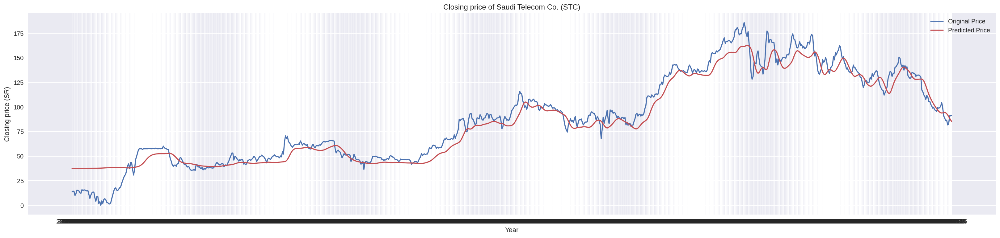

In [128]:
#plot of prediction price for STC

plt.style.use("seaborn")
plt.figure(figsize=(25, 6))
plt.plot(data_test3.index,y_test3,'b',label='Original Price')
plt.plot(data_test3.index,y_predicted3,'r',label='Predicted Price')
plt.title('Closing price of Saudi Telecom Co. (STC)')
plt.ylabel('Closing price (SR)')
plt.xlabel('Year')
plt.legend()
plt.show()

In [100]:
#results

testdata3= pd.DataFrame()
testdata3['date']=data_test3.index
testdata3['Actual_close'] = y_test3
testdata3['Predict_close'] = y_predicted3

testdata3['p>0.1a']=(testdata3['Actual_close']-0.15*testdata3['Actual_close'])

testdata3['p<0.1a']=testdata3['Actual_close']+0.15*testdata3['Actual_close']


testdata3['results_LSTM'] =(testdata3['Predict_close']>=testdata3['Actual_close']-0.15*testdata3['Actual_close'])&(testdata3['Predict_close']<=testdata3['Actual_close']+0.15*testdata3['Actual_close'])

testdata3.head()

,date,Actual_close,Predict_close,p>0.1a,p<0.1a,results_LSTM
0,2016-08-17,13.597082,37.692310,11.557520,15.636644,False
1,2016-08-18,14.434270,37.687309,12.269129,16.599410,False
2,2016-08-21,14.058979,37.682549,11.950132,16.167826,False
3,2016-08-22,10.017383,37.678047,8.514776,11.519991,False
4,2016-08-23,12.009312,37.674492,10.207916,13.810709,False


In [101]:
(((testdata3['results_LSTM'].value_counts())/len(testdata3['results_LSTM']))*100).round(2).astype(str)+'%'

True     82.64%
False    17.36%
Name: results_LSTM, dtype: object

# **Benchmark Model**

## *Support Vector Machine Model*

### *Preprocessing*

In [186]:
# to do feature_select
df_svm=feature_select(grouped_STC)
df_svm.tail()

,change,close,value_traded,no_trades_
date,,,,
2020-03-01,-1.7,80.9,107902881.8,2826.0
2020-03-02,0.3,81.2,102920290.4,3817.0
2020-03-03,2.9,84.1,94188392.9,2972.0
2020-03-04,0.0,84.1,89670960.4,2131.0
2020-03-05,0.2,84.3,59576818.4,2733.0


In [187]:
# create new colom
df_svm['Prediction'] = df_svm[['close']].shift(-180)

In [188]:
# to show head datset
df_svm.head()

,change,close,value_traded,no_trades_,Prediction
date,,,,,
2003-01-25,35.75,35.75,1.520917e+09,6369.0,62.50
2003-01-26,-0.75,35.00,6.621076e+08,4179.0,63.00
2003-01-27,-1.50,33.50,7.221220e+08,5128.0,62.75
2003-01-28,-0.25,33.25,1.708552e+08,3003.0,63.50
2003-01-29,-1.75,31.50,2.894504e+08,3563.0,62.75


In [189]:
# value of prediction
df_svm['Prediction'].values

array([62.5 , 63.  , 62.75, ...,   nan,   nan,   nan])

In [190]:
X = np.array(df_svm.drop(['Prediction'],1))
# Remove the last 180 rows
X = X[:-180]
X.shape

(4253, 4)

In [191]:
# shape of y
y = np.array(df_svm['Prediction'])
# Remove Last 180 rows
y = y[:-180]
print(y.shape)

(4253,)


### *Split*

In [192]:
# split dataset
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

### *Apply Support Vector Machine*

In [214]:
# Apply Support Vector Machine
svr = svm.SVR(C=10000,kernel= 'rbf')    
# Train the model 
svr.fit(x_train, y_train)

SVR(C=10000)

In [215]:
# prediction
preds_svr = svr.predict(x_test)

### *Results*

In [216]:
#The performance of the system was evaluated using Mean Absolute Percentage Error (MAPE), 
#Root Mean Squared Error (RMSE) and Mean Squared Error (MSE) and compared with the models
mean_absolute_error(y_true=y_test, y_pred=preds_svr)

18.871982461774266

In [217]:
#Results
mea_svm = mean_absolute_error(y_true=y_test, y_pred=preds_svr)
mea_svm = mean_squared_error(y_test, preds_svr)
mea_svm  = r2_score(y_test, preds_svr)
print("The model performance for testing set")
print("--------------------------------------")
print('MAE is {}'.format(mea_svm))
print('MSE is {}'.format(mea_svm))
print('R2 score is {}'.format(mea_svm))

The model performance for testing set
--------------------------------------
MAE is 0.23735405399323062
MSE is 0.23735405399323062
R2 score is 0.23735405399323062


### *Evaluating*

In [218]:
# Function for evaluating regression models
def reg_cost(method, actual, preds):
    mae = mean_absolute_error(y_true=actual, y_pred=preds)
    mse = mean_squared_error(y_true=actual, y_pred=preds)
    
    print(f'Cost functions for the {method} regression is:')
    print(f'Mean Square Error: {round(mse,2)}')
    print(f'Mean Absolute Error: {round(mae,2)}\n\n')

In [219]:
# Result for the Support Vector regression 
model_name = ['Support Vector']
model_pred = [preds_svr]

for x in range(len(model_pred)):
    
    reg_cost(model_name[x],y_test, model_pred[x] )

Cost functions for the Support Vector regression is:
Mean Square Error: 603.6
Mean Absolute Error: 18.87




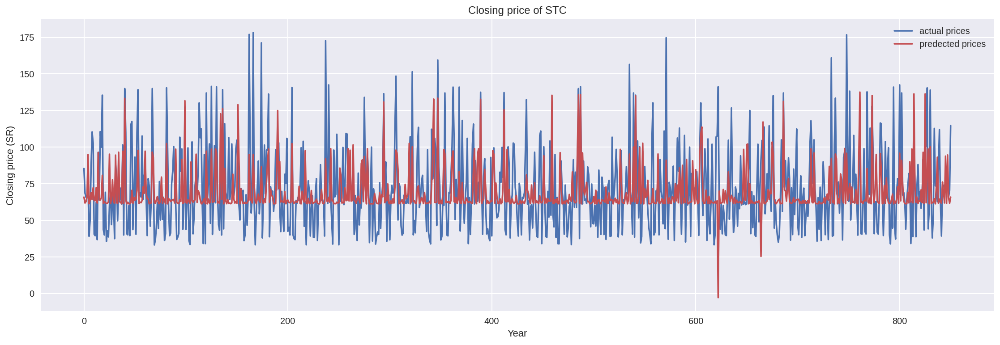

In [220]:
#plot of Closing price of STC
plt.style.use("seaborn")
plt.figure(figsize=(17, 6))
plt.plot(y_test,'b',label='actual prices')
plt.plot(preds_svr,'r',label='predected prices')
plt.title('Closing price of STC')
plt.ylabel('Closing price (SR)')
plt.xlabel('Year')
plt.legend()
plt.show()

In [221]:
#results
testdata= pd.DataFrame()

testdata['Actual_close'] = y_test
testdata['Predict_close'] = preds_svr

testdata['p>0.1a']=(testdata['Actual_close']-0.15*testdata['Actual_close'])

testdata['p<0.1a']=testdata['Actual_close']+0.15*testdata['Actual_close']


testdata['results_SVM'] =(testdata['Predict_close']>=testdata['Actual_close']-0.15*testdata['Actual_close'])&(testdata['Predict_close']<=testdata['Actual_close']+0.15*testdata['Actual_close'])

testdata.head()

,Actual_close,Predict_close,p>0.1a,p<0.1a,results_SVM
0,85.40,65.864284,72.5900,98.2100,False
1,68.56,61.831916,58.2760,78.8440,True
2,65.75,62.815588,55.8875,75.6125,True
3,66.00,65.860549,56.1000,75.9000,True
4,74.50,94.963705,63.3250,85.6750,False


In [222]:
#results
(((testdata['results_SVM'].value_counts())/len(testdata['results_SVM']))*100).round(2).astype(str)+'%'

False    63.45%
True     36.55%
Name: results_SVM, dtype: object

## Grid search

In [202]:
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000, 10000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf','sigmoid']}
 
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
 
# fitting the model for grid search
grid.fit(x_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits
[CV 1/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.022 total time=   0.5s
[CV 2/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.018 total time=   0.5s
[CV 3/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.012 total time=   0.5s
[CV 4/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.019 total time=   0.5s
[CV 5/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.027 total time=   0.5s
[CV 1/5] END ...C=0.1, gamma=1, kernel=sigmoid;, score=-0.022 total time=   0.3s
[CV 2/5] END ...C=0.1, gamma=1, kernel=sigmoid;, score=-0.018 total time=   0.3s
[CV 3/5] END ...C=0.1, gamma=1, kernel=sigmoid;, score=-0.012 total time=   0.3s
[CV 4/5] END ...C=0.1, gamma=1, kernel=sigmoid;, score=-0.019 total time=   0.3s
[CV 5/5] END ...C=0.1, gamma=1, kernel=sigmoid;, score=-0.029 total time=   0.3s
[CV 1/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.022 total time=   0.5s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;

GridSearchCV(estimator=SVR(),
             param_grid={'C': [0.1, 1, 10, 100, 1000, 10000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'sigmoid']},
             verbose=3)

In [203]:
#result in dataframe
grid_df = pd.DataFrame(grid.cv_results_)

grid_df 

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.408613,0.005523,0.110993,0.003055,0.1,1,rbf,"{'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}",-0.022128,-1.779049e-02,-0.011754,-1.904429e-02,-2.677420e-02,-0.019498,0.004959,19
1,0.256223,0.002088,0.047241,0.001005,0.1,1,sigmoid,"{'C': 0.1, 'gamma': 1, 'kernel': 'sigmoid'}",-0.022479,-1.840697e-02,-0.012050,-1.920925e-02,-2.897966e-02,-0.020225,0.005530,30
2,0.396772,0.011625,0.109344,0.005407,0.1,0.1,rbf,"{'C': 0.1, 'gamma': 0.1, 'kernel': 'rbf'}",-0.022128,-1.779049e-02,-0.011754,-1.904429e-02,-2.677420e-02,-0.019498,0.004959,19
3,0.254687,0.004247,0.046609,0.000642,0.1,0.1,sigmoid,"{'C': 0.1, 'gamma': 0.1, 'kernel': 'sigmoid'}",-0.022455,-1.838764e-02,-0.012030,-1.917109e-02,-2.889420e-02,-0.020188,0.005509,29
4,0.402792,0.004884,0.108410,0.001112,0.1,0.01,rbf,"{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}",-0.022128,-1.779049e-02,-0.011754,-1.904429e-02,-2.677420e-02,-0.019498,0.004959,18
5,0.256037,0.005525,0.047267,0.001115,0.1,0.01,sigmoid,"{'C': 0.1, 'gamma': 0.01, 'kernel': 'sigmoid'}",-0.022120,-1.814652e-02,-0.011865,-1.921804e-02,-2.830629e-02,-0.019931,0.005361,22
6,0.401184,0.002840,0.106869,0.000521,0.1,0.001,rbf,"{'C': 0.1, 'gamma': 0.001, 'kernel': 'rbf'}",-0.022128,-1.778882e-02,-0.011754,-1.904429e-02,-2.677421e-02,-0.019498,0.004959,17
7,0.254578,0.003941,0.046420,0.001636,0.1,0.001,sigmoid,"{'C': 0.1, 'gamma': 0.001, 'kernel': 'sigmoid'}",-0.022016,-1.773798e-02,-0.011753,-1.905930e-02,-2.688313e-02,-0.019490,0.004983,16
8,0.401258,0.005654,0.107221,0.000530,0.1,0.0001,rbf,"{'C': 0.1, 'gamma': 0.0001, 'kernel': 'rbf'}",-0.022128,-1.778627e-02,-0.011763,-1.904298e-02,-2.677087e-02,-0.019498,0.004955,21
9,0.256323,0.003850,0.046555,0.001281,0.1,0.0001,sigmoid,"{'C': 0.1, 'gamma': 0.0001, 'kernel': 'sigmoid'}",-0.022780,-1.845313e-02,-0.012474,-1.961949e-02,-2.740603e-02,-0.020147,0.004932,23


In [204]:
#parameters
parameters = ['param_C','param_gamma','param_kernel', 'mean_test_score','std_test_score','rank_test_score']

grid_df[parameters].head()

,param_C,param_gamma,param_kernel,mean_test_score,std_test_score,rank_test_score
0,0.1,1,rbf,-0.019498,0.004959,19
1,0.1,1,sigmoid,-0.020225,0.005530,30
2,0.1,0.1,rbf,-0.019498,0.004959,19
3,0.1,0.1,sigmoid,-0.020188,0.005509,29
4,0.1,0.01,rbf,-0.019498,0.004959,18


In [205]:
#rank_test_score
grid_df[parameters].sort_values('rank_test_score').head()

,param_C,param_gamma,param_kernel,mean_test_score,std_test_score,rank_test_score
50,10000,1,rbf,-0.000664,0.000819,1
52,10000,0.1,rbf,-0.000664,0.000819,1
42,1000,0.1,rbf,-0.000664,0.000819,1
40,1000,1,rbf,-0.000664,0.000819,1
54,10000,0.01,rbf,-0.000664,0.000819,5


In [206]:
#grid.best_params
grid.best_params_

{'C': 1000, 'gamma': 1, 'kernel': 'rbf'}

In [207]:
#grid.best_params
grid.best_score_

-0.0006640761815634554

In [208]:
#grid.best_params SVR
grid.best_estimator_

SVR(C=1000, gamma=1)

# Model Results Comparison

In [209]:
# Compare between the modles

print("The model performance for ARIMA")
print("----------")
print('MAE is {}'.format(mae_arima))
print('MSE is {}'.format(mse_arima))
print('R2 score is {}'.format(r2_arima))
print("--------------------------------------")
print("")
print("The model performance for LSTM")
print("----------")
print('MAE is {}'.format(mea_lstm))
print('MSE is {}'.format(mse_lstm))
print('R2 score is {}'.format(r2_lstm))
print("--------------------------------------")
print("")
print("The model performance for SVM")
print("----------")
print('MAE is {}'.format(mea_svm))
print('MSE is {}'.format(mea_svm))
print('R2 score is {}'.format(mea_svm))

The model performance for ARIMA
----------
MAE is 32.81452353988375
MSE is 1101.5549639711633
R2 score is -43.48568659789965
--------------------------------------

The model performance for LSTM
----------
MAE is 0.04515116784106228
MSE is 0.0035657933304117564
R2 score is 0.9389658078613315
--------------------------------------

The model performance for SVM
----------
MAE is 0.23735405399323062
MSE is 0.23735405399323062
R2 score is 0.23735405399323062
